In [1]:
# Import required libraries

# pandas - For data manipulation and analysis of tabular data (landmarks and protocol files)
import pandas as pd

# numpy - For numerical operations and array manipulation of pupil measurements
import numpy as np

# matplotlib - For creating static visualizations of pupil response data
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import to_rgba

# pathlib - For cross-platform file path handling
from pathlib import Path

# logging - For tracking program execution and debugging information
import logging

# scipy.signal - For signal processing operations like Savitzky-Golay filtering
from scipy import signal

# seaborn - For enhanced statistical data visualization built on matplotlib
import seaborn as sns

# shapely.geometry - For polygon area calculation
from shapely.geometry import Polygon

# Configure logging
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s'
)
logger = logging.getLogger(__name__)

In [2]:
batches_path = Path().cwd().parent / "data"

landmarks_path = r"/home/lrn/Repos/analyze-eye-tracking-data/data/7d5af5d8-d72f-43aa-a722-5855d5b6b3fc/7d5af5d8-d72f-43aa-a722-5855d5b6b3fc_plr_landmarks.csv"
prototo_path = r"/home/lrn/Repos/analyze-eye-tracking-data/data/7d5af5d8-d72f-43aa-a722-5855d5b6b3fc/7d5af5d8-d72f-43aa-a722-5855d5b6b3fc_plr_protocol.csv"

In [3]:
landmarks_df = pd.read_csv(landmarks_path)
landmarks_df

,Unnamed: 0,timestamp,id,retcode,left_lm_1_x,left_lm_1_y,left_lm_2_x,left_lm_2_y,left_lm_3_x,left_lm_3_y,...,right_lm_23_x,right_lm_23_y,right_lm_24_x,right_lm_24_y,right_lm_25_x,right_lm_25_y,right_lm_26_x,right_lm_26_y,right_lm_27_x,right_lm_27_y
0,0,2024-08-29 02:09:16.588,257,OK,227.5,819.0,277.5,794.5,308.0,787.8,...,847.5,753.5,814.5,753.0,815.0,769.8,879.8,762.5,924.2,778.8
1,1,2024-08-29 02:09:16.621,258,OK,241.5,842.2,297.2,837.8,330.5,828.0,...,809.8,794.5,788.0,793.8,788.5,802.5,859.5,799.5,904.5,810.2
2,2,2024-08-29 02:09:16.658,259,OK,252.0,849.8,308.2,837.2,340.5,828.0,...,811.8,799.0,786.8,798.0,787.0,807.5,853.8,804.2,898.0,814.2
3,3,2024-08-29 02:09:16.693,260,OK,236.2,845.2,292.2,840.2,326.8,832.0,...,824.8,795.2,800.2,795.0,800.5,808.2,866.8,797.5,910.2,812.5
4,4,2024-08-29 02:09:16.724,261,OK,221.5,842.0,278.2,828.8,314.0,820.5,...,841.2,787.5,820.8,786.8,821.0,794.5,883.5,791.2,930.0,803.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,236,2024-08-29 02:09:24.457,493,OK,177.0,808.8,229.0,760.8,264.8,754.2,...,812.8,742.5,788.0,742.0,787.5,758.5,862.5,726.2,900.2,753.8
237,237,2024-08-29 02:09:24.491,494,OK,178.8,808.2,232.2,760.8,267.8,754.5,...,815.0,742.0,788.8,741.5,788.5,758.8,864.2,723.8,901.8,753.2
238,238,2024-08-29 02:09:24.525,495,OK,180.2,804.8,233.5,760.2,268.8,754.5,...,816.5,742.0,790.8,741.5,790.8,758.2,864.8,725.0,901.8,753.0
239,239,2024-08-29 02:09:24.557,496,OK,184.8,808.2,237.8,760.8,273.2,754.0,...,821.0,742.5,795.2,742.2,795.0,759.2,869.2,726.2,907.2,754.8


In [4]:
landmarks_df['timestamp'] = pd.to_datetime(landmarks_df['timestamp'])
float_columns = landmarks_df.select_dtypes(include=['float64']).columns
landmarks_df[float_columns] = landmarks_df[float_columns].astype('float32')

In [5]:
print(landmarks_df.dtypes)

Unnamed: 0                int64
timestamp        datetime64[ns]
id                        int64
retcode                  object
left_lm_1_x             float32
                      ...      
right_lm_25_y           float32
right_lm_26_x           float32
right_lm_26_y           float32
right_lm_27_x           float32
right_lm_27_y           float32
Length: 112, dtype: object


In [6]:
ok_landmarks_df = landmarks_df[landmarks_df['retcode'] == 'OK'].copy()
   
    # Reset index after filtering
ok_landmarks_df.reset_index(drop=True, inplace=True)

logger.info(f"Removed {len(landmarks_df) - len(ok_landmarks_df)} frames with invalid retCode")

2025-04-19 08:03:22,859 - INFO - Removed 0 frames with invalid retCode


In [7]:
index = 2
ok_landmarks_df.iloc[index]['left_lm_8_x']

np.float32(349.2)

In [8]:
# Create the results DataFrame by selecting 'id' and 'timestamp' columns from ok_landmarks_df
results = ok_landmarks_df[['id', 'timestamp']].copy()

# Display the new results DataFrame
results


,id,timestamp
0,257,2024-08-29 02:09:16.588
1,258,2024-08-29 02:09:16.621
2,259,2024-08-29 02:09:16.658
3,260,2024-08-29 02:09:16.693
4,261,2024-08-29 02:09:16.724
...,...,...
236,493,2024-08-29 02:09:24.457
237,494,2024-08-29 02:09:24.491
238,495,2024-08-29 02:09:24.525
239,496,2024-08-29 02:09:24.557


In [9]:
# Print the data types of each column in the results DataFrame
print(results.dtypes)

id                    int64
timestamp    datetime64[ns]
dtype: object


In [22]:
def extract_center(row: pd.Series, side: str) -> tuple:
    """ Extract the center tuple of points (x,y) of the eye (left or right). """
    return (row[f'{side}_lm_8_x'], row[f'{side}_lm_8_y'])

for side in ['left', 'right']:
    # Apply the function to each row of the DataFrame and create new columns
    results[f'center_{side}'] = ok_landmarks_df.apply(extract_center, axis=1, side=side)

results

,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,polygon_circle_pupil_right,polygon_circle_iris_right,circumference_polygon_pupil_left,circumference_polygon_iris_left,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,"POLYGON ((849.3699469178345 760.7999877929688,...","POLYGON ((875.3115158092705 760.7999877929688,...",77.369721,225.935806,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,"POLYGON ((810.539015521804 797, 809.9137998327...","POLYGON ((833.8425665226426 797, 831.954700162...",10.791005,36.319443,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,"POLYGON ((812.0507569162083 802, 811.343630908...","POLYGON ((833.4158538494787 802, 831.551107958...",42.302651,109.563654,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,"POLYGON ((826.4320986652308 801, 825.677219130...","POLYGON ((850.1746566370572 801, 848.133339822...",11.906224,86.553012,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,"POLYGON ((841.7097930588815 789.7999877929688,...","POLYGON ((868.1818749605856 789.7999877929688,...",12.348522,117.554662,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,"POLYGON ((815.0725475504458 750.7999877929688,...","POLYGON ((847.8054337450964 750.7999877929688,...",102.670222,302.327116,93.021677,297.752604,

In [23]:
def extract_sclera_points(row: pd.Series, side: str) -> list[tuple]:
    """ Extract a list of coordinates tuples of all points that form the sclera fissure, using the landmarks: [1, 21, 12, 19, 14, 15, 5, 17, 4, 3, 2, 26]"""
    return [
        (row[f'{side}_lm_1_x'], row[f'{side}_lm_1_y']),
        (row[f'{side}_lm_21_x'], row[f'{side}_lm_21_y']),
        (row[f'{side}_lm_12_x'], row[f'{side}_lm_12_y']),
        (row[f'{side}_lm_19_x'], row[f'{side}_lm_19_y']),
        (row[f'{side}_lm_14_x'], row[f'{side}_lm_14_y']),
        (row[f'{side}_lm_15_x'], row[f'{side}_lm_15_y']),
        (row[f'{side}_lm_5_x'], row[f'{side}_lm_5_y']),
        (row[f'{side}_lm_17_x'], row[f'{side}_lm_17_y']),
        (row[f'{side}_lm_4_x'], row[f'{side}_lm_4_y']),
        (row[f'{side}_lm_3_x'], row[f'{side}_lm_3_y']),
        (row[f'{side}_lm_2_x'], row[f'{side}_lm_2_y']),
        (row[f'{side}_lm_26_x'], row[f'{side}_lm_26_y'])
    ]


def extract_iris_points(row: pd.Series, side: str) -> list[tuple]:
    """ Extract a list of coordinates tuples of all points that form the side ball, using the landmarks: [11, 20, 13, 18, 6] """
    return [
        (row[f'{side}_lm_11_x'], row[f'{side}_lm_11_y']),
        (row[f'{side}_lm_20_x'], row[f'{side}_lm_20_y']),
        (row[f'{side}_lm_13_x'], row[f'{side}_lm_13_y']),
        (row[f'{side}_lm_18_x'], row[f'{side}_lm_18_y']),
        (row[f'{side}_lm_6_x'], row[f'{side}_lm_6_y'])
    ]

def extract_pupil_points(row: pd.Series, side: str) -> list[tuple]:
    """ Extract a list of coordinates tuples of all points that form the pupil, using the landmarks: [7, 25, 9, 22, 10, 23, 24] """
    return [
        (row[f'{side}_lm_7_x'], row[f'{side}_lm_7_y']),
        (row[f'{side}_lm_25_x'], row[f'{side}_lm_25_y']),
        (row[f'{side}_lm_9_x'], row[f'{side}_lm_9_y']),
        (row[f'{side}_lm_22_x'], row[f'{side}_lm_22_y']),
        (row[f'{side}_lm_10_x'], row[f'{side}_lm_10_y']),
        (row[f'{side}_lm_23_x'], row[f'{side}_lm_23_y']),
        (row[f'{side}_lm_24_x'], row[f'{side}_lm_24_y'])
    ]

for side in ['left', 'right']:
    # Apply the function to each row of the DataFrame and create new columns
    results[f'points_pupil_{side}'] = ok_landmarks_df.apply(extract_pupil_points, axis=1, side=side)
    results[f'points_iris_{side}'] = ok_landmarks_df.apply(extract_iris_points, axis=1, side=side)
    results[f'points_sclera_{side}'] = ok_landmarks_df.apply(extract_sclera_points, axis=1, side=side)

results

,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,polygon_circle_pupil_right,polygon_circle_iris_right,circumference_polygon_pupil_left,circumference_polygon_iris_left,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,"POLYGON ((849.3699469178345 760.7999877929688,...","POLYGON ((875.3115158092705 760.7999877929688,...",77.369721,225.935806,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,"POLYGON ((810.539015521804 797, 809.9137998327...","POLYGON ((833.8425665226426 797, 831.954700162...",10.791005,36.319443,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,"POLYGON ((812.0507569162083 802, 811.343630908...","POLYGON ((833.4158538494787 802, 831.551107958...",42.302651,109.563654,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,"POLYGON ((826.4320986652308 801, 825.677219130...","POLYGON ((850.1746566370572 801, 848.133339822...",11.906224,86.553012,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,"POLYGON ((841.7097930588815 789.7999877929688,...","POLYGON ((868.1818749605856 789.7999877929688,...",12.348522,117.554662,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,"POLYGON ((815.0725475504458 750.7999877929688,...","POLYGON ((847.8054337450964 750.7999877929688,...",102.670222,302.327116,93.021677,297.752604,

In [24]:
def create_polygon(row: pd.Series, side: str, eye_part: str) -> Polygon:
    """ Create a polygon from a list of points. """
    return Polygon(row[f'points_{eye_part}_{side}'])

# Create polygons for the pupil, iris, and sclera for both left and right eyes
for side in ['left', 'right']:
    for eye_part in ['pupil', 'iris', 'sclera']:
        results[f'polygon_{eye_part}_{side}'] = results.apply(create_polygon, axis=1, side=side, eye_part=eye_part)

results

,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,polygon_circle_pupil_right,polygon_circle_iris_right,circumference_polygon_pupil_left,circumference_polygon_iris_left,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,"POLYGON ((849.3699469178345 760.7999877929688,...","POLYGON ((875.3115158092705 760.7999877929688,...",77.369721,225.935806,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,"POLYGON ((810.539015521804 797, 809.9137998327...","POLYGON ((833.8425665226426 797, 831.954700162...",10.791005,36.319443,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,"POLYGON ((812.0507569162083 802, 811.343630908...","POLYGON ((833.4158538494787 802, 831.551107958...",42.302651,109.563654,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,"POLYGON ((826.4320986652308 801, 825.677219130...","POLYGON ((850.1746566370572 801, 848.133339822...",11.906224,86.553012,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,"POLYGON ((841.7097930588815 789.7999877929688,...","POLYGON ((868.1818749605856 789.7999877929688,...",12.348522,117.554662,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,"POLYGON ((815.0725475504458 750.7999877929688,...","POLYGON ((847.8054337450964 750.7999877929688,...",102.670222,302.327116,93.021677,297.752604,

In [25]:
def extract_radiuses(row: pd.Series, side: str, eye_part: str) -> list[float]:
    """ Extract the radiuses of the pupil by calculating the distances from the center to each pupil point. """
    # Extract the center of the eye
    center = row[f'center_{side}']
    
    # Extract the pupil points
    eye_part_points = row[f'points_{eye_part}_{side}']
    
    # Calculate the distances from the center to each pupil point
    distances = [np.linalg.norm(np.array(center) - np.array(point)) for point in eye_part_points]
    
    return distances

# Extract the radiuses of the pupil
for side in ['left', 'right']:
    results[f'radiuses_pupil_{side}'] = results.apply(extract_radiuses, axis=1, side=side, eye_part='pupil')
    results[f'radiuses_iris_{side}'] = results.apply(extract_radiuses, axis=1, side=side, eye_part='iris')
results

,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,polygon_circle_pupil_right,polygon_circle_iris_right,circumference_polygon_pupil_left,circumference_polygon_iris_left,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,"POLYGON ((849.3699469178345 760.7999877929688,...","POLYGON ((875.3115158092705 760.7999877929688,...",77.369721,225.935806,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,"POLYGON ((810.539015521804 797, 809.9137998327...","POLYGON ((833.8425665226426 797, 831.954700162...",10.791005,36.319443,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,"POLYGON ((812.0507569162083 802, 811.343630908...","POLYGON ((833.4158538494787 802, 831.551107958...",42.302651,109.563654,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,"POLYGON ((826.4320986652308 801, 825.677219130...","POLYGON ((850.1746566370572 801, 848.133339822...",11.906224,86.553012,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,"POLYGON ((841.7097930588815 789.7999877929688,...","POLYGON ((868.1818749605856 789.7999877929688,...",12.348522,117.554662,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,"POLYGON ((815.0725475504458 750.7999877929688,...","POLYGON ((847.8054337450964 750.7999877929688,...",102.670222,302.327116,93.021677,297.752604,

In [26]:
def calculate_radius_mean(row: pd.Series, side: str, eye_part: str) -> float:
    """ Calculate the mean radius of the pupil. """
    # Extract the radiuses
    radiuses = row[f'radiuses_{eye_part}_{side}']
        
    return np.mean(radiuses)

# Calculate the mean radius of the pupil
for side in ['left', 'right']:
    results[f'radius_mean_pupil_{side}'] = results.apply(calculate_radius_mean, axis=1, side=side, eye_part='pupil')
    results[f'radius_mean_iris_{side}'] = results.apply(calculate_radius_mean, axis=1, side=side, eye_part='iris')
results

,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,polygon_circle_pupil_right,polygon_circle_iris_right,circumference_polygon_pupil_left,circumference_polygon_iris_left,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,"POLYGON ((849.3699469178345 760.7999877929688,...","POLYGON ((875.3115158092705 760.7999877929688,...",77.369721,225.935806,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,"POLYGON ((810.539015521804 797, 809.9137998327...","POLYGON ((833.8425665226426 797, 831.954700162...",10.791005,36.319443,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,"POLYGON ((812.0507569162083 802, 811.343630908...","POLYGON ((833.4158538494787 802, 831.551107958...",42.302651,109.563654,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,"POLYGON ((826.4320986652308 801, 825.677219130...","POLYGON ((850.1746566370572 801, 848.133339822...",11.906224,86.553012,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,"POLYGON ((841.7097930588815 789.7999877929688,...","POLYGON ((868.1818749605856 789.7999877929688,...",12.348522,117.554662,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,"POLYGON ((815.0725475504458 750.7999877929688,...","POLYGON ((847.8054337450964 750.7999877929688,...",102.670222,302.327116,93.021677,297.752604,

In [27]:
def calculate_radius_median(row: pd.Series, side: str, eye_part: str) -> float:
    """ Calculate the median radius of the pupil. """
    # Extract the radiuses
    radiuses = row[f'radiuses_{eye_part}_{side}']
        
    return np.median(radiuses)

# Calculate the median radius of the pupil
for side in ['left', 'right']:
    results[f'radius_median_pupil_{side}'] = results.apply(calculate_radius_median, axis=1, side=side, eye_part='pupil')
    results[f'radius_median_iris_{side}'] = results.apply(calculate_radius_median, axis=1, side=side, eye_part='iris')
results

,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,polygon_circle_pupil_right,polygon_circle_iris_right,circumference_polygon_pupil_left,circumference_polygon_iris_left,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,"POLYGON ((849.3699469178345 760.7999877929688,...","POLYGON ((875.3115158092705 760.7999877929688,...",77.369721,225.935806,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,"POLYGON ((810.539015521804 797, 809.9137998327...","POLYGON ((833.8425665226426 797, 831.954700162...",10.791005,36.319443,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,"POLYGON ((812.0507569162083 802, 811.343630908...","POLYGON ((833.4158538494787 802, 831.551107958...",42.302651,109.563654,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,"POLYGON ((826.4320986652308 801, 825.677219130...","POLYGON ((850.1746566370572 801, 848.133339822...",11.906224,86.553012,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,"POLYGON ((841.7097930588815 789.7999877929688,...","POLYGON ((868.1818749605856 789.7999877929688,...",12.348522,117.554662,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,"POLYGON ((815.0725475504458 750.7999877929688,...","POLYGON ((847.8054337450964 750.7999877929688,...",102.670222,302.327116,93.021677,297.752604,

In [28]:
def calcaulte_radius_std(row: pd.Series, side: str, eye_part: str) -> bool:
    """ validates the radius of the pupil by making sure that the distances of the pupil points from the center are within a reasonable similar range. """
    # Extract the radiuses of the pupil
    eye_part_radiuses = row[f'radiuses_{eye_part}_{side}']
    
    # Check if the standard deviation of the distances is less than 0.5
    return np.std(eye_part_radiuses)

# Validate the radius of the pupil
for side in ['left', 'right']:
    results[f'std_radius_pupil_{side}'] = results.apply(calcaulte_radius_std, axis=1, side=side, eye_part='pupil')
    results[f'std_radius_iris_{side}'] = results.apply(calcaulte_radius_std, axis=1, side=side, eye_part='iris')
results

,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,polygon_circle_pupil_right,polygon_circle_iris_right,circumference_polygon_pupil_left,circumference_polygon_iris_left,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,"POLYGON ((849.3699469178345 760.7999877929688,...","POLYGON ((875.3115158092705 760.7999877929688,...",77.369721,225.935806,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,"POLYGON ((810.539015521804 797, 809.9137998327...","POLYGON ((833.8425665226426 797, 831.954700162...",10.791005,36.319443,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,"POLYGON ((812.0507569162083 802, 811.343630908...","POLYGON ((833.4158538494787 802, 831.551107958...",42.302651,109.563654,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,"POLYGON ((826.4320986652308 801, 825.677219130...","POLYGON ((850.1746566370572 801, 848.133339822...",11.906224,86.553012,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,"POLYGON ((841.7097930588815 789.7999877929688,...","POLYGON ((868.1818749605856 789.7999877929688,...",12.348522,117.554662,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,"POLYGON ((815.0725475504458 750.7999877929688,...","POLYGON ((847.8054337450964 750.7999877929688,...",102.670222,302.327116,93.021677,297.752604,

In [29]:
def calculate_circle_circumference(row: pd.Series, side: str, eye_part: str) -> float:
    """ Calculate the circumference of the circle using the mean radius. """
    # Extract the mean radius
    mean_radius = row[f'radius_mean_{eye_part}_{side}']
    
    # Calculate the circumference
    circumference = 2 * np.pi * mean_radius
    
    return circumference

# Calculate the circumference of the circle using the mean radius
for side in ['left', 'right']:
    results[f'circumference_pupil_{side}'] = results.apply(calculate_circle_circumference, axis=1, side=side, eye_part='pupil')
    results[f'circumference_iris_{side}'] = results.apply(calculate_circle_circumference, axis=1, side=side, eye_part='iris')
results


,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,polygon_circle_pupil_right,polygon_circle_iris_right,circumference_polygon_pupil_left,circumference_polygon_iris_left,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,"POLYGON ((849.3699469178345 760.7999877929688,...","POLYGON ((875.3115158092705 760.7999877929688,...",77.369721,225.935806,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,"POLYGON ((810.539015521804 797, 809.9137998327...","POLYGON ((833.8425665226426 797, 831.954700162...",10.791005,36.319443,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,"POLYGON ((812.0507569162083 802, 811.343630908...","POLYGON ((833.4158538494787 802, 831.551107958...",42.302651,109.563654,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,"POLYGON ((826.4320986652308 801, 825.677219130...","POLYGON ((850.1746566370572 801, 848.133339822...",11.906224,86.553012,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,"POLYGON ((841.7097930588815 789.7999877929688,...","POLYGON ((868.1818749605856 789.7999877929688,...",12.348522,117.554662,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,"POLYGON ((815.0725475504458 750.7999877929688,...","POLYGON ((847.8054337450964 750.7999877929688,...",102.670222,302.327116,93.021677,297.752604,

In [30]:
def create_circle_polygon(row: pd.Series, side: str, eye_part: str) -> Polygon:
    """ Create a circle polygon from the center and radius. """
    # Extract the center of the eye
    center = row[f'center_{side}']
    
    # Extract the mean radius of the pupil
    radius = row[f'radius_mean_{eye_part}_{side}']
    
    # Create a circle polygon using the center and radius
    circle = Polygon([(
        center[0] + radius * np.cos(theta),
        center[1] + radius * np.sin(theta)
    ) for theta in np.linspace(0, 2 * np.pi, 20)])
    
    return circle

# Create circle polygons for the left eye ball, iris, and pupil
for side in ['left', 'right']:
    results[f'polygon_circle_pupil_{side}'] = results.apply(create_circle_polygon, axis=1, side=side, eye_part='pupil')
    results[f'polygon_circle_iris_{side}'] = results.apply(create_circle_polygon, axis=1, side=side, eye_part='iris')
results

,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,polygon_circle_pupil_right,polygon_circle_iris_right,circumference_polygon_pupil_left,circumference_polygon_iris_left,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,"POLYGON ((849.3699469178345 760.7999877929688,...","POLYGON ((875.3115158092705 760.7999877929688,...",77.369721,225.935806,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,"POLYGON ((810.539015521804 797, 809.9137998327...","POLYGON ((833.8425665226426 797, 831.954700162...",10.791005,36.319443,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,"POLYGON ((812.0507569162083 802, 811.343630908...","POLYGON ((833.4158538494787 802, 831.551107958...",42.302651,109.563654,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,"POLYGON ((826.4320986652308 801, 825.677219130...","POLYGON ((850.1746566370572 801, 848.133339822...",11.906224,86.553012,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,"POLYGON ((841.7097930588815 789.7999877929688,...","POLYGON ((868.1818749605856 789.7999877929688,...",12.348522,117.554662,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,"POLYGON ((815.0725475504458 750.7999877929688,...","POLYGON ((847.8054337450964 750.7999877929688,...",102.670222,302.327116,93.021677,297.752604,

In [31]:
def calculate_circle_polygon_circumference(row: pd.Series, side: str, eye_part: str) -> float:
    """ Calculate the circumference of the circle polygon. """
    # Extract the circle polygon
    circle_polygon = row[f'polygon_circle_{eye_part}_{side}']
    
    # Calculate the circumference of the circle polygon
    circumference = circle_polygon.length
    
    return circumference

# Calculate the circumference of the circle polygon using the mean radius
for side in ['left', 'right']:
    results[f'circumference_polygon_pupil_{side}'] = results.apply(calculate_circle_polygon_circumference, axis=1, side=side, eye_part='pupil')
    results[f'circumference_polygon_iris_{side}'] = results.apply(calculate_circle_polygon_circumference, axis=1, side=side, eye_part='iris')
results

,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,polygon_circle_pupil_right,polygon_circle_iris_right,circumference_polygon_pupil_left,circumference_polygon_iris_left,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,"POLYGON ((849.3699469178345 760.7999877929688,...","POLYGON ((875.3115158092705 760.7999877929688,...",77.369721,225.935806,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,"POLYGON ((810.539015521804 797, 809.9137998327...","POLYGON ((833.8425665226426 797, 831.954700162...",10.791005,36.319443,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,"POLYGON ((812.0507569162083 802, 811.343630908...","POLYGON ((833.4158538494787 802, 831.551107958...",42.302651,109.563654,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,"POLYGON ((826.4320986652308 801, 825.677219130...","POLYGON ((850.1746566370572 801, 848.133339822...",11.906224,86.553012,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,"POLYGON ((841.7097930588815 789.7999877929688,...","POLYGON ((868.1818749605856 789.7999877929688,...",12.348522,117.554662,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,"POLYGON ((815.0725475504458 750.7999877929688,...","POLYGON ((847.8054337450964 750.7999877929688,...",102.670222,302.327116,93.021677,297.752604,

In [32]:
IRIS_DIAMETER_MM = 11.7

def convert_circumference_pixels_to_mm(row: pd.Series, side: str, eye_part: str) -> float:
    """ Convert the circumference from pixels to mm. """
    # Extract the circumference in pixels
    circumference_pixels = row[f'circumference_{eye_part}_{side}']
    # Convert the circumference to mm
    circumference_mm = circumference_pixels * mm_per_pixel
    return circumference_mm

# Calculate the average diameter of the iris in pixels
avg_iris_diameter = results[f'circumference_iris_{side}'].mean()

# Calculate the mm per pixel conversion factor
mm_per_pixel = IRIS_DIAMETER_MM / avg_iris_diameter

# Convert the circumference from pixels to mm
for side in ['left', 'right']:
    results[f'circumference_mm_iris_{side}'] = results.apply(convert_circumference_pixels_to_mm, axis=1, side=side, eye_part='iris')
    results[f'circumference_mm_pupil_{side}'] = results.apply(convert_circumference_pixels_to_mm, axis=1, side=side, eye_part='pupil')
results

,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,polygon_circle_pupil_right,polygon_circle_iris_right,circumference_polygon_pupil_left,circumference_polygon_iris_left,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,"POLYGON ((849.3699469178345 760.7999877929688,...","POLYGON ((875.3115158092705 760.7999877929688,...",77.369721,225.935806,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,"POLYGON ((810.539015521804 797, 809.9137998327...","POLYGON ((833.8425665226426 797, 831.954700162...",10.791005,36.319443,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,"POLYGON ((812.0507569162083 802, 811.343630908...","POLYGON ((833.4158538494787 802, 831.551107958...",42.302651,109.563654,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,"POLYGON ((826.4320986652308 801, 825.677219130...","POLYGON ((850.1746566370572 801, 848.133339822...",11.906224,86.553012,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,"POLYGON ((841.7097930588815 789.7999877929688,...","POLYGON ((868.1818749605856 789.7999877929688,...",12.348522,117.554662,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,"POLYGON ((815.0725475504458 750.7999877929688,...","POLYGON ((847.8054337450964 750.7999877929688,...",102.670222,302.327116,93.021677,297.752604,

In [33]:
results.dtypes

id                                            int64
timestamp                            datetime64[ns]
center_left                                  object
center_right                                 object
points_pupil_left                            object
points_iris_left                             object
points_sclera_left                           object
points_pupil_right                           object
points_iris_right                            object
points_sclera_right                          object
polygon_pupil_left                           object
polygon_iris_left                            object
polygon_sclera_left                          object
polygon_pupil_right                          object
polygon_iris_right                           object
polygon_sclera_right                         object
radiuses_pupil_left                          object
radiuses_iris_left                           object
radiuses_pupil_right                         object
radiuses_iri

In [34]:
def calculate_eye_opening(row: pd.Series, side: str) -> float:
    """ Calculate the eye opening by calculating the distance between the top and bottom eyelids. """
    # Extract the top and bottom eyelid points
    top_eyelid = row[f'{side}_lm_3_y']
    bottom_eyelid = row[f'{side}_lm_19_y']
    
    # Calculate the eye opening
    eye_opening = abs(top_eyelid - bottom_eyelid)
    
    return eye_opening

# Calculate the eye opening for the left and right eyes
for side in ['left', 'right']:
    results[f'eye_opening_{side}'] = ok_landmarks_df.apply(calculate_eye_opening, axis=1, side=side).astype('float32')
results

,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,circumference_polygon_pupil_left,circumference_polygon_iris_left,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right,eye_opening_left,eye_opening_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,77.369721,225.935806,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731,46.700012,46.000000
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,10.791005,36.319443,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078,6.200012,33.200012
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,42.302651,109.563654,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684,22.000000,31.599976
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,11.906224,86.553012,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913,7.500000,42.799988
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,12.348522,117.554662,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993,20.500000,30.200012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,102.670222,302.327116,93.021677,297.752604,11.913810,4.045927,11.733542,3.665707,87.000000,86.299988
237,494,2024-08-29 02:09:24.491,"(269.0, 795.7999877929688)","(801.7999877929688, 750.5)","[(285.0, 795.7999877929688), (282.200012207031...","[(216.5, 795.5), (225.1999969482422, 822.5), (...","[(178.8000030517578, 808.2000122070312), (201....","[(786.2000122070312, 750.5), (788.5, 758.79998...","[(853.0, 749.7999877929688), (846.0, 775.5), (...","[(890.5, 752.2000122070312), (867.5, 777.79998...",...,100.118137,299.921352,98.097709,302.331678,11.819006,3.945357,11.913990,3.865738

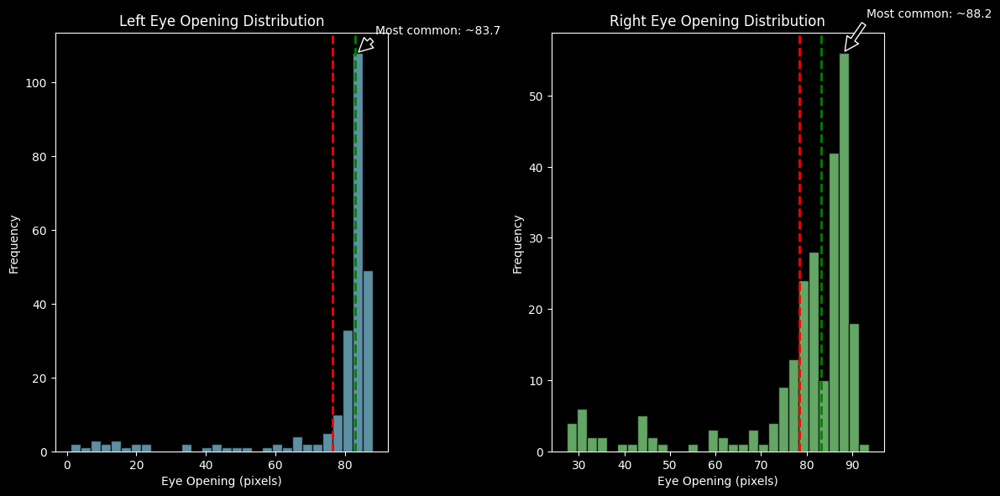

Found 16 potential blink frames

Potential blink timestamps:
Frame 1: 2024-08-29 02:09:16.621000 - Left: 6.20, Right: 33.20
Frame 2: 2024-08-29 02:09:16.658000 - Left: 22.00, Right: 31.60
Frame 3: 2024-08-29 02:09:16.693000 - Left: 7.50, Right: 42.80
Frame 4: 2024-08-29 02:09:16.724000 - Left: 20.50, Right: 30.20
Frame 10: 2024-08-29 02:09:16.923000 - Left: 15.20, Right: 35.30
Frame 11: 2024-08-29 02:09:16.958000 - Left: 20.20, Right: 31.00
Frame 12: 2024-08-29 02:09:16.992000 - Left: 1.00, Right: 31.50
Frame 13: 2024-08-29 02:09:17.024000 - Left: 9.00, Right: 28.20
Frame 42: 2024-08-29 02:09:17.990000 - Left: 7.30, Right: 43.20
Frame 43: 2024-08-29 02:09:18.023000 - Left: 17.50, Right: 34.00
Frame 44: 2024-08-29 02:09:18.057000 - Left: 2.40, Right: 32.00
Frame 45: 2024-08-29 02:09:18.092000 - Left: 11.20, Right: 43.80
Frame 79: 2024-08-29 02:09:19.224000 - Left: 13.60, Right: 27.30
Frame 80: 2024-08-29 02:09:19.259000 - Left: 23.00, Right: 30.50
Frame 81: 2024-08-29 02:09:19.290000 - 

In [ ]:
# Create a histogram to find the distribution of eye opening values
plt.figure(figsize=(12, 6))

# Plot left eye opening
plt.subplot(1, 2, 1)
left_hist = plt.hist(results['eye_opening_left'], bins=30, color='skyblue', alpha=0.7, edgecolor='black')
plt.axvline(results['eye_opening_left'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(results['eye_opening_left'].median(), color='green', linestyle='dashed', linewidth=2)
plt.title('Left Eye Opening Distribution')
plt.xlabel('Eye Opening (pixels)')
plt.ylabel('Frequency')

# Annotate the most common bucket
max_count_idx = np.argmax(left_hist[0])
max_count_value = (left_hist[1][max_count_idx] + left_hist[1][max_count_idx+1])/2
plt.annotate(f'Most common: ~{max_count_value:.1f}', 
             xy=(max_count_value, left_hist[0][max_count_idx]),
             xytext=(max_count_value+5, left_hist[0][max_count_idx]+5),
             arrowprops=dict(facecolor='black', shrink=0.05))

# Plot right eye opening
plt.subplot(1, 2, 2)
right_hist = plt.hist(results['eye_opening_right'], bins=30, color='lightgreen', alpha=0.7, edgecolor='black')
plt.axvline(results['eye_opening_right'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(results['eye_opening_right'].median(), color='green', linestyle='dashed', linewidth=2)
plt.title('Right Eye Opening Distribution')
plt.xlabel('Eye Opening (pixels)')
plt.ylabel('Frequency')

# Annotate the most common bucket
max_count_idx = np.argmax(right_hist[0])
max_count_value = (right_hist[1][max_count_idx] + right_hist[1][max_count_idx+1])/2
plt.annotate(f'Most common: ~{max_count_value:.1f}', 
             xy=(max_count_value, right_hist[0][max_count_idx]),
             xytext=(max_count_value+5, right_hist[0][max_count_idx]+5),
             arrowprops=dict(facecolor='black', shrink=0.05))

plt.tight_layout()
plt.show()

# Find potential blinks
# A common threshold is 70-80% below the median eye opening
left_median = results['eye_opening_left'].median()
right_median = results['eye_opening_right'].median()
left_threshold = left_median * 0.3  # 70% reduction
right_threshold = right_median * 0.3  # 70% reduction

potential_blinks = results[(results['eye_opening_left'] < left_threshold) | 
                          (results['eye_opening_right'] < right_threshold)]

print(f"Found {len(potential_blinks)} potential blink frames")
if len(potential_blinks) > 0:
    print("\nPotential blink timestamps:")
    for idx, row in potential_blinks.iterrows():
        print(f"Frame {idx}: {row['timestamp']} - Left: {row['eye_opening_left']:.2f}, Right: {row['eye_opening_right']:.2f}")

In [42]:
left_median = results['eye_opening_left'].median()
right_median = results['eye_opening_right'].median()
left_threshold = left_median * 0.55  # 70% reduction
right_threshold = right_median * 0.55  # 70% reduction

def validate_blinking(row: pd.Series, side: str, threshold: float) -> bool:
    """ Validate if the eye is blinking by checking if the eye opening is below the threshold. """
    # Extract the eye opening
    eye_opening = row[f'eye_opening_{side}']
    
    # Check if the eye opening is below the threshold
    return eye_opening < threshold

# Validate the blinking for the left and right eyes
for side, threshold in zip(['left', 'right'], [left_threshold, right_threshold]):
    results[f'blink_{side}'] = results.apply(validate_blinking, axis=1, side=side, threshold=threshold)
results

,id,timestamp,center_left,center_right,points_pupil_left,points_iris_left,points_sclera_left,points_pupil_right,points_iris_right,points_sclera_right,...,circumference_polygon_pupil_right,circumference_polygon_iris_right,circumference_mm_iris_left,circumference_mm_pupil_left,circumference_mm_iris_right,circumference_mm_pupil_right,eye_opening_left,eye_opening_right,blink_left,blink_right
0,257,2024-08-29 02:09:16.588,"(307.0, 804.0)","(831.0, 760.7999877929688)","[(320.0, 803.5), (318.0, 809.5), (307.20001220...","[(269.5, 806.2000122070312), (278.0, 825.79998...","[(227.5, 819.0), (252.0, 832.0), (279.20001220...","[(812.2000122070312, 761.2000122070312), (815....","[(880.2000122070312, 764.5), (872.200012207031...","[(906.5, 774.7999877929688), (880.5, 791.20001...",...,114.896568,277.150560,8.903456,3.048910,10.921677,4.527731,46.700012,46.000000,False,False
1,258,2024-08-29 02:09:16.621,"(338.5, 832.0)","(799.0, 797.0)","[(336.79998779296875, 831.5), (336.5, 832.0), ...","[(333.79998779296875, 833.0), (333.79998779296...","[(241.5, 842.2000122070312), (268.799987792968...","[(786.7999877929688, 797.2000122070312), (788....","[(836.0, 802.0), (827.5, 817.5), (798.5, 825.5...","[(885.7999877929688, 807.5), (859.5, 820.0), (...",...,72.171862,217.926123,1.431241,0.425241,8.587819,2.844078,6.200012,33.200012,True,True
2,259,2024-08-29 02:09:16.658,"(349.20001220703125, 834.2000122070312)","(799.0, 802.0)","[(355.79998779296875, 834.0), (354.20001220703...","[(333.0, 835.2000122070312), (335.799987792968...","[(252.0, 849.7999877929688), (280.5, 859.5), (...","[(785.5, 802.2000122070312), (787.0, 807.5), (...","[(836.7999877929688, 807.2000122070312), (827....","[(880.2000122070312, 811.0), (853.799987792968...",...,81.627192,215.257208,4.317577,1.667021,8.482645,3.216684,22.000000,31.599976,True,True
3,260,2024-08-29 02:09:16.693,"(331.0, 833.7999877929688)","(812.5, 801.0)","[(329.5, 833.2000122070312), (329.200012207031...","[(316.0, 836.5), (318.0, 841.2000122070312), (...","[(236.1999969482422, 845.2000122070312), (263....","[(798.2000122070312, 801.5), (800.5, 808.20001...","[(851.0, 803.0), (843.5, 822.7999877929688), (...","[(893.0, 808.7999877929688), (866.200012207031...",...,87.139627,235.639698,3.410796,0.469189,9.285858,3.433913,7.500000,42.799988,True,True
4,261,2024-08-29 02:09:16.724,"(314.0, 828.5)","(830.7999877929688, 789.7999877929688)","[(312.20001220703125, 828.2000122070312), (312...","[(293.0, 831.7999877929688), (296.799987792968...","[(221.5, 842.0), (248.5, 848.7999877929688), (...","[(819.5, 790.2000122070312), (821.0, 794.5), (...","[(872.7999877929688, 795.0), (865.200012207031...","[(909.5, 800.7999877929688), (882.799987792968...",...,68.236407,233.808543,4.632479,0.486618,9.213697,2.688993,20.500000,30.200012,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,493,2024-08-29 02:09:24.457,"(267.79998779296875, 797.2000122070312)","(800.2000122070312, 750.7999877929688)","[(284.5, 797.2000122070312), (281.5, 805.79998...","[(215.1999969482422, 796.7999877929688), (223....","[(177.0, 808.7999877929688), (199.800003051757...","[(785.5, 750.7999877929688), (787.5, 758.5), (...","[(851.0, 750.5), (844.0, 775.2000122070312), (...","[(888.2000122070312, 752.0), (865.5, 774.0), (...",...,93.021677,297.752604,11.913810,4.045927,11.733542,3.665707,87.000000,86.299988,False,False
237,494,2024-08-29 02:09:24.491,"(269.0, 795.7999877929688)","(801.7999877929688, 750.5)","[(285.0, 795.7999877929688), (282.200012207031...","[(216.5, 795.5), (225.1999969482422, 822.5), (...","[(178.8000030517578, 808.2000122070312), (201....","[(786.2000122070312, 750.5), (788.5, 758.79998...","[(853.0, 749.7999877929688), (846.0, 775.5), (...","[(890.5, 752.2000122070312), (867.5, 777.79998...",...,98.097709,302.331678,11.819006,3.945357,11.913990,3.865738,86.700012,89.000000,False,False
238,495,2024-08-29 02:09:24.525,"(270.5, 795.5)","(803.7999877929688, 750.2000122070312)","[

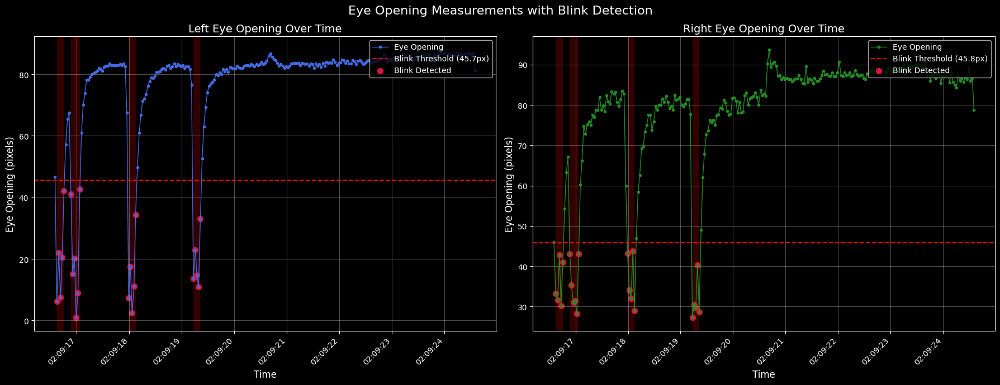

In [49]:
# Create time-series plots of eye opening with continuous lines but highlighted blinks
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates
import numpy as np

# Create figure and subplots (1 row, 2 columns)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

# Calculate thresholds for both eyes
left_median = results['eye_opening_left'].median()
right_median = results['eye_opening_right'].median()
left_threshold = left_median * 0.55  # Using the same threshold value as in your code
right_threshold = right_median * 0.55

# --- Left Eye Plot ---
# Create a continuous line for all points
ax1.plot(results['timestamp'], results['eye_opening_left'], 
         '-o', color='royalblue', markersize=3, linewidth=1, label='Eye Opening')

# Add a horizontal line for the threshold
ax1.axhline(y=left_threshold, color='red', linestyle='--', linewidth=1.5, 
           label=f'Blink Threshold ({left_threshold:.1f}px)')

# Highlight the blink sections with different styling
blink_mask = results['blink_left']
if blink_mask.any():
    ax1.scatter(results.loc[blink_mask, 'timestamp'], 
                results.loc[blink_mask, 'eye_opening_left'],
                color='crimson', s=50, marker='o', label='Blink Detected')
    
    # Add shading for blink regions
    for idx in np.where(np.diff(np.concatenate(([0], blink_mask.astype(int), [0]))))[0].reshape(-1, 2):
        if idx[1] > idx[0]:  # Ensure valid range
            ax1.axvspan(results.iloc[idx[0]]['timestamp'], 
                        results.iloc[idx[1]-1]['timestamp'], 
                        alpha=0.2, color='red', lw=0)

# Customize left subplot appearance
ax1.set_title('Left Eye Opening Over Time', fontsize=14)
ax1.set_xlabel('Time', fontsize=12)
ax1.set_ylabel('Eye Opening (pixels)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(loc='upper right')

# Format x-axis to show time better
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45, ha='right')

# --- Right Eye Plot ---
# Create a continuous line for all points
ax2.plot(results['timestamp'], results['eye_opening_right'], 
         '-o', color='forestgreen', markersize=3, linewidth=1, label='Eye Opening')

# Add a horizontal line for the threshold
ax2.axhline(y=right_threshold, color='red', linestyle='--', linewidth=1.5, 
           label=f'Blink Threshold ({right_threshold:.1f}px)')

# Highlight the blink sections with different styling
blink_mask = results['blink_right']
if blink_mask.any():
    ax2.scatter(results.loc[blink_mask, 'timestamp'], 
                results.loc[blink_mask, 'eye_opening_right'],
                color='crimson', s=50, marker='o', label='Blink Detected')
    
    # Add shading for blink regions
    for idx in np.where(np.diff(np.concatenate(([0], blink_mask.astype(int), [0]))))[0].reshape(-1, 2):
        if idx[1] > idx[0]:  # Ensure valid range
            ax2.axvspan(results.iloc[idx[0]]['timestamp'], 
                        results.iloc[idx[1]-1]['timestamp'], 
                        alpha=0.2, color='red', lw=0)

# Customize right subplot appearance
ax2.set_title('Right Eye Opening Over Time', fontsize=14)
ax2.set_xlabel('Time', fontsize=12)
ax2.set_ylabel('Eye Opening (pixels)', fontsize=12)
ax2.grid(True, alpha=0.3)
ax2.legend(loc='upper right')

# Format x-axis to show time better
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45, ha='right')

# Add a common suptitle
plt.suptitle('Eye Opening Measurements with Blink Detection', fontsize=16, y=0.98)

# Adjust layout and show plot
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

In [45]:
# --- Enhanced Animation with Complete Eye Elements for Both Eyes ---
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
import numpy as np
from collections import deque

def evaluate_plot_limits(data, padding_factor=0.2, min_padding=10):
    """Calculate optimal plot limits based on sclera fissure points with padding factor."""
    
    # Extract all x and y coordinates from both left and right sclera fissure points
    all_x = []
    all_y = []
    
    # Iterate through all rows and collect all sclera fissure points (left and right)
    for points in data['points_sclera_left']:
        for point in points:
            all_x.append(point[0])
            all_y.append(point[1])
    
    for points in data['points_sclera_right']:
        for point in points:
            all_x.append(point[0])
            all_y.append(point[1])
    
    # Calculate padding
    x_padding = (max(all_x) - min(all_x)) * padding_factor if max(all_x) != min(all_x) else min_padding
    y_padding = (max(all_y) - min(all_y)) * padding_factor if max(all_y) != min(all_y) else min_padding
    
    # Calculate limits
    x_min = min(all_x) - x_padding
    x_max = max(all_x) + x_padding
    y_min = min(all_y) - y_padding
    y_max = max(all_y) + y_padding
    
    return x_min, x_max, y_min, y_max

def initialize_figure_and_axes_plot_elements(x_min, x_max, y_min, y_max, trail_length=20):
    """Initialize the figure, axes, and all plot elements with dark style."""
    # Set dark background style
    plt.style.use('dark_background')
    plt.subplots_adjust(bottom=0.2)  # Increase bottom margin
    # Create figure and axes
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Configure axes
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xlabel("X Coordinate", color='white')
    ax.set_ylabel("Y Coordinate", color='white')
    ax.set_title("Complete Eye Tracking Visualization (Both Eyes)", color='white')
    ax.grid(True, alpha=0.3)
    ax.set_aspect('equal', adjustable='box')
    ax.invert_yaxis()  # Invert y-axis for correct orientation
    
    # Set tick colors to white
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')
    
    # Initialize plot elements with proper z-ordering (higher zorder = appears on top)
    
    # 1. Circle polygons (ideal circular shapes) - dashed lines
    circle_iris_left, = ax.plot([], [], 'g', alpha=0.5, linewidth=1.0, 
                                 label='Left Ideal Iris', zorder=1)
    circle_pupil_left, = ax.plot([], [], 'c', alpha=0.5, linewidth=1.0, 
                                  label='Left Ideal Pupil', zorder=2)
    circle_iris_right, = ax.plot([], [], 'g', alpha=0.5, linewidth=1.0, 
                                  label='Right Ideal Iris', zorder=1)
    circle_pupil_right, = ax.plot([], [], 'c', alpha=0.5, linewidth=1.0, 
                                   label='Right Ideal Pupil', zorder=2)
    
    # 2. sclera elements
    sclera_polygon_left, = ax.plot([], [], 'y-', alpha=0.7, linewidth=1.5, 
                                      label='Left Sclera', zorder=3)
    sclera_scatter_left = ax.scatter([], [], facecolors='yellow', alpha=0.6, s=10, 
                                       label='Left Sclera Points', zorder=4)
    sclera_polygon_right, = ax.plot([], [], 'y-', alpha=0.7, linewidth=1.5, 
                                       label='Right Sclera', zorder=3)
    sclera_scatter_right = ax.scatter([], [], facecolors='yellow', alpha=0.6, s=10, 
                                        label='Right Sclera Points', zorder=4)
    
    # 3. Iris elements
    iris_polygon_left, = ax.plot([], [], color='g', linestyle=':', alpha=0.7, linewidth=1.5, 
                                label='Left Iris', zorder=5)
    iris_scatter_left = ax.scatter([], [], facecolors='green', alpha=0.6, s=10, 
                                  label='Left Iris Points', zorder=6)
    iris_polygon_right, = ax.plot([], [], color='g', linestyle=':', alpha=0.7, linewidth=1.5, 
                                 label='Right Iris', zorder=5)
    iris_scatter_right = ax.scatter([], [], facecolors='green', alpha=0.6, s=10, 
                                   label='Right Iris Points', zorder=6)
    
    # 4. Pupil elements
    pupil_polygon_left, = ax.plot([], [], color='c', linestyle=':', alpha=0.7, linewidth=1.5, 
                                 label='Left Pupil', zorder=7)
    pupil_scatter_left = ax.scatter([], [], facecolors='cyan', alpha=0.6, s=10, 
                                   label='Left Pupil Points', zorder=8)
    pupil_polygon_right, = ax.plot([], [], color='c', linestyle=':', alpha=0.7, linewidth=1.5, 
                                  label='Right Pupil', zorder=7)
    pupil_scatter_right = ax.scatter([], [], facecolors='cyan', alpha=0.6, s=10, 
                                    label='Right Pupil Points', zorder=8)
    
    # 5. Center pupil and trail
    center_trail_scatter_left = ax.scatter([], [], facecolors='none', edgecolors=[], s=50, 
                                         label='Left Center Trail', zorder=9)
    center_scatter_left = ax.scatter([], [], facecolors='none', edgecolors='red', s=100, 
                                    label='Left Center', zorder=10)
    center_trail_scatter_right = ax.scatter([], [], facecolors='none', edgecolors=[], s=50, 
                                          label='Right Center Trail', zorder=9)
    center_scatter_right = ax.scatter([], [], facecolors='none', edgecolors='#FF1493', s=100, 
                                     label='Right Center', zorder=10)
    
    # Text element for timestamp/frame info
    time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes, color='white', 
                        bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))
    
    # With this configuration to place the legend below:
    ax.legend(
        loc='upper center',
        bbox_to_anchor=(0.5, -0.15),  # Position below the plot
        framealpha=0.6, 
        fontsize='small',
        ncol=3,        # Use more columns for better horizontal spacing
        frameon=True,  # Keep the frame around the legend
        borderaxespad=0
    )
    
    # Dictionary to store plot elements and state
    plot_elements = {
        # Left eye elements
        'center_scatter_left': center_scatter_left,
        'center_trail_scatter_left': center_trail_scatter_left,
        'sclera_scatter_left': sclera_scatter_left,
        'sclera_polygon_left': sclera_polygon_left,
        'iris_scatter_left': iris_scatter_left,
        'iris_polygon_left': iris_polygon_left,
        'pupil_scatter_left': pupil_scatter_left,
        'pupil_polygon_left': pupil_polygon_left,
        'circle_iris_polygon_left': circle_iris_left,
        'circle_pupil_polygon_left': circle_pupil_left,
        
        # Right eye elements
        'center_scatter_right': center_scatter_right,
        'center_trail_scatter_right': center_trail_scatter_right,
        'sclera_scatter_right': sclera_scatter_right,
        'sclera_polygon_right': sclera_polygon_right,
        'iris_scatter_right': iris_scatter_right,
        'iris_polygon_right': iris_polygon_right,
        'pupil_scatter_right': pupil_scatter_right,
        'pupil_polygon_right': pupil_polygon_right,
        'circle_iris_polygon_right': circle_iris_right,
        'circle_pupil_polygon_right': circle_pupil_right,
        
        # Common elements
        'time_text': time_text,
        
        # History tracking for trails
        'center_history_left': deque(maxlen=trail_length),
        'center_history_right': deque(maxlen=trail_length),
        'trail_length': trail_length,
        'trail_base_color_left': (1, 0, 0),  # Red for left eye
        'trail_base_color_right': (1, 0, 0)  
    }
    
    return fig, ax, plot_elements

def update_center_trail(center_history, center_trail_scatter, base_color):
    """Update the center trail with gradient transparency for outlines."""
    num_points = len(center_history)
    
    if num_points > 0:
        center_trail_offsets = np.array(list(center_history))
        min_alpha = 0.1
        max_alpha = 1.0
        edge_colors = []
        for i in range(num_points):
            # Calculate alpha based on position in history (newest = highest alpha)
            alpha = min_alpha + (max_alpha - min_alpha) * (i / (num_points - 1)) if num_points > 1 else max_alpha
            edge_colors.append((*base_color, alpha))
        
        center_trail_scatter.set_offsets(center_trail_offsets)
        center_trail_scatter.set_edgecolors(edge_colors)
        center_trail_scatter.set_facecolors('none')
    else:
        center_trail_scatter.set_offsets(np.empty((0, 2)))
        center_trail_scatter.set_edgecolors(np.empty((0, 4)))
        center_trail_scatter.set_facecolors('none')

def extract_polygon_points(polygon):
    """Extract x,y coordinates from a Shapely polygon."""
    x, y = polygon.exterior.xy
    return list(zip(x, y))

def initialize_interactive_animation_display(fig, data, interval=150):
    """Set up the FuncAnimation object with initialization and update functions."""
    frames_count = len(data)
    
    def init():
        """Initialize animation elements to empty state."""
        # Reset all plot elements to empty state
        
        # Left eye elements
        plot_elements['center_scatter_left'].set_offsets(np.empty((0, 2)))
        plot_elements['center_trail_scatter_left'].set_offsets(np.empty((0, 2)))
        plot_elements['sclera_scatter_left'].set_offsets(np.empty((0, 2)))
        plot_elements['sclera_polygon_left'].set_data([], [])
        plot_elements['iris_scatter_left'].set_offsets(np.empty((0, 2)))
        plot_elements['iris_polygon_left'].set_data([], [])
        plot_elements['pupil_scatter_left'].set_offsets(np.empty((0, 2)))
        plot_elements['pupil_polygon_left'].set_data([], [])
        plot_elements['circle_iris_polygon_left'].set_data([], [])
        plot_elements['circle_pupil_polygon_left'].set_data([], [])
        
        # Right eye elements
        plot_elements['center_scatter_right'].set_offsets(np.empty((0, 2)))
        plot_elements['center_trail_scatter_right'].set_offsets(np.empty((0, 2)))
        plot_elements['sclera_scatter_right'].set_offsets(np.empty((0, 2)))
        plot_elements['sclera_polygon_right'].set_data([], [])
        plot_elements['iris_scatter_right'].set_offsets(np.empty((0, 2)))
        plot_elements['iris_polygon_right'].set_data([], [])
        plot_elements['pupil_scatter_right'].set_offsets(np.empty((0, 2)))
        plot_elements['pupil_polygon_right'].set_data([], [])
        plot_elements['circle_iris_polygon_right'].set_data([], [])
        plot_elements['circle_pupil_polygon_right'].set_data([], [])
        
        # Common elements
        plot_elements['time_text'].set_text('')
        plot_elements['center_history_left'].clear()
        plot_elements['center_history_right'].clear()
        
        # Return all elements that will be updated
        return (
            # Left eye elements
            plot_elements['center_scatter_left'],
            plot_elements['center_trail_scatter_left'],
            plot_elements['sclera_scatter_left'],
            plot_elements['sclera_polygon_left'],
            plot_elements['iris_scatter_left'],
            plot_elements['iris_polygon_left'],
            plot_elements['pupil_scatter_left'],
            plot_elements['pupil_polygon_left'],
            plot_elements['circle_iris_polygon_left'],
            plot_elements['circle_pupil_polygon_left'],
            
            # Right eye elements
            plot_elements['center_scatter_right'],
            plot_elements['center_trail_scatter_right'],
            plot_elements['sclera_scatter_right'],
            plot_elements['sclera_polygon_right'],
            plot_elements['iris_scatter_right'],
            plot_elements['iris_polygon_right'],
            plot_elements['pupil_scatter_right'],
            plot_elements['pupil_polygon_right'],
            plot_elements['circle_iris_polygon_right'],
            plot_elements['circle_pupil_polygon_right'],
            
            # Common elements
            plot_elements['time_text']
        )
    
    def update(frame_index):
        """Update visual elements for the current frame."""
        current_row = data.iloc[frame_index]
        timestamp = current_row['timestamp']
        
        # Extract center points
        center_point_left = current_row['center_left']
        center_point_right = current_row['center_right']
        
        # Extract points data for both eyes
        sclera_points_left = current_row['points_sclera_left']
        iris_points_left = current_row['points_iris_left']
        pupil_points_left = current_row['points_pupil_left']
        
        sclera_points_right = current_row['points_sclera_right']
        iris_points_right = current_row['points_iris_right']
        pupil_points_right = current_row['points_pupil_right']
        
        # Extract circle polygons for reference shapes
        circle_iris_left = current_row['polygon_circle_iris_left']
        circle_pupil_left = current_row['polygon_circle_pupil_left']
        circle_iris_right = current_row['polygon_circle_iris_right']
        circle_pupil_right = current_row['polygon_circle_pupil_right']
        
        # Update LEFT eye elements
        
        # Update center point
        plot_elements['center_scatter_left'].set_offsets([center_point_left])
        
        # Add current position to history and update trail
        plot_elements['center_history_left'].append(center_point_left)
        update_center_trail(
            plot_elements['center_history_left'], 
            plot_elements['center_trail_scatter_left'], 
            plot_elements['trail_base_color_left']
        )
        
        # Update scatter points for eye elements
        plot_elements['sclera_scatter_left'].set_offsets(sclera_points_left)
        plot_elements['iris_scatter_left'].set_offsets(iris_points_left)
        plot_elements['pupil_scatter_left'].set_offsets(pupil_points_left)
        
        # Update polygon outlines (closed polygons)
        # sclera/Sclera
        sclera_x_left = [point[0] for point in sclera_points_left]
        sclera_y_left = [point[1] for point in sclera_points_left]
        if sclera_points_left:
            sclera_x_left.append(sclera_points_left[0][0])  # Close the polygon
            sclera_y_left.append(sclera_points_left[0][1])
        plot_elements['sclera_polygon_left'].set_data(sclera_x_left, sclera_y_left)
        
        # Iris
        iris_x_left = [point[0] for point in iris_points_left]
        iris_y_left = [point[1] for point in iris_points_left]
        if iris_points_left:
            iris_x_left.append(iris_points_left[0][0])  # Close the polygon
            iris_y_left.append(iris_points_left[0][1])
        plot_elements['iris_polygon_left'].set_data(iris_x_left, iris_y_left)
        
        # Pupil
        pupil_x_left = [point[0] for point in pupil_points_left]
        pupil_y_left = [point[1] for point in pupil_points_left]
        if pupil_points_left:
            pupil_x_left.append(pupil_points_left[0][0])  # Close the polygon
            pupil_y_left.append(pupil_points_left[0][1])
        plot_elements['pupil_polygon_left'].set_data(pupil_x_left, pupil_y_left)
        
        # Update RIGHT eye elements
        
        # Update center point
        plot_elements['center_scatter_right'].set_offsets([center_point_right])
        
        # Add current position to history and update trail
        plot_elements['center_history_right'].append(center_point_right)
        update_center_trail(
            plot_elements['center_history_right'], 
            plot_elements['center_trail_scatter_right'], 
            plot_elements['trail_base_color_right']
        )
        
        # Update scatter points for eye elements
        plot_elements['sclera_scatter_right'].set_offsets(sclera_points_right)
        plot_elements['iris_scatter_right'].set_offsets(iris_points_right)
        plot_elements['pupil_scatter_right'].set_offsets(pupil_points_right)
        
        # Update polygon outlines (closed polygons)
        # sclera/Sclera
        sclera_x_right = [point[0] for point in sclera_points_right]
        sclera_y_right = [point[1] for point in sclera_points_right]
        if sclera_points_right:
            sclera_x_right.append(sclera_points_right[0][0])  # Close the polygon
            sclera_y_right.append(sclera_points_right[0][1])
        plot_elements['sclera_polygon_right'].set_data(sclera_x_right, sclera_y_right)
        
        # Iris
        iris_x_right = [point[0] for point in iris_points_right]
        iris_y_right = [point[1] for point in iris_points_right]
        if iris_points_right:
            iris_x_right.append(iris_points_right[0][0])  # Close the polygon
            iris_y_right.append(iris_points_right[0][1])
        plot_elements['iris_polygon_right'].set_data(iris_x_right, iris_y_right)
        
        # Pupil
        pupil_x_right = [point[0] for point in pupil_points_right]
        pupil_y_right = [point[1] for point in pupil_points_right]
        if pupil_points_right:
            pupil_x_right.append(pupil_points_right[0][0])  # Close the polygon
            pupil_y_right.append(pupil_points_right[0][1])
        plot_elements['pupil_polygon_right'].set_data(pupil_x_right, pupil_y_right)
        
        # Update circle polygons (ideal shapes) for LEFT eye
        circle_iris_points_left = extract_polygon_points(circle_iris_left)
        circle_iris_x_left = [p[0] for p in circle_iris_points_left]
        circle_iris_y_left = [p[1] for p in circle_iris_points_left]
        plot_elements['circle_iris_polygon_left'].set_data(circle_iris_x_left, circle_iris_y_left)
        
        circle_pupil_points_left = extract_polygon_points(circle_pupil_left)
        circle_pupil_x_left = [p[0] for p in circle_pupil_points_left]
        circle_pupil_y_left = [p[1] for p in circle_pupil_points_left]
        plot_elements['circle_pupil_polygon_left'].set_data(circle_pupil_x_left, circle_pupil_y_left)
        
        # Update circle polygons (ideal shapes) for RIGHT eye
        circle_iris_points_right = extract_polygon_points(circle_iris_right)
        circle_iris_x_right = [p[0] for p in circle_iris_points_right]
        circle_iris_y_right = [p[1] for p in circle_iris_points_right]
        plot_elements['circle_iris_polygon_right'].set_data(circle_iris_x_right, circle_iris_y_right)
        
        circle_pupil_points_right = extract_polygon_points(circle_pupil_right)
        circle_pupil_x_right = [p[0] for p in circle_pupil_points_right]
        circle_pupil_y_right = [p[1] for p in circle_pupil_points_right]
        plot_elements['circle_pupil_polygon_right'].set_data(circle_pupil_x_right, circle_pupil_y_right)
        
        # Update time text with frame info
        plot_elements['time_text'].set_text(f'Frame: {frame_index}\nTime: {timestamp}')
        
        # Return all elements that were updated
        return (
            # Left eye elements
            plot_elements['center_scatter_left'],
            plot_elements['center_trail_scatter_left'],
            plot_elements['sclera_scatter_left'],
            plot_elements['sclera_polygon_left'],
            plot_elements['iris_scatter_left'],
            plot_elements['iris_polygon_left'],
            plot_elements['pupil_scatter_left'],
            plot_elements['pupil_polygon_left'],
            plot_elements['circle_iris_polygon_left'],
            plot_elements['circle_pupil_polygon_left'],
            
            # Right eye elements
            plot_elements['center_scatter_right'],
            plot_elements['center_trail_scatter_right'],
            plot_elements['sclera_scatter_right'],
            plot_elements['sclera_polygon_right'],
            plot_elements['iris_scatter_right'],
            plot_elements['iris_polygon_right'],
            plot_elements['pupil_scatter_right'],
            plot_elements['pupil_polygon_right'],
            plot_elements['circle_iris_polygon_right'],
            plot_elements['circle_pupil_polygon_right'],
            
            # Common elements
            plot_elements['time_text']
        )
    
    # Create and return the animation object
    ani = FuncAnimation(fig, update, frames=frames_count, init_func=init, interval=interval, blit=True, repeat=True)
    return ani

def create_visualization_interactive_display(data, trail_length=20, max_frames=None, animation_interval=150):
    """Create and display an interactive visualization of eye tracking elements."""
    # Apply max_frames limit if specified
    if max_frames is not None and max_frames < len(data):
        data = data.iloc[:max_frames].copy()
    
    # 1. Calculate plot limits based on sclera fissure points (both eyes)
    x_min, x_max, y_min, y_max = evaluate_plot_limits(data)
    
    # 2. Initialize figure and plot elements
    global fig, ax, plot_elements  # Make accessible to animation functions
    fig, ax, plot_elements = initialize_figure_and_axes_plot_elements(
        x_min, x_max, y_min, y_max, trail_length
    )
    
    # Enable the matplotlib toolbar with zoom capabilities
    # plt.rcParams['toolbar'] = 'toolbar2'
    
    # 3. Initialize and create animation
    ani = initialize_interactive_animation_display(fig, data, interval=animation_interval)
    return ani

# --- Run the animation ---
# Animation Parameters
TRAIL_LENGTH = 10  # Number of previous positions to show
MAX_FRAMES = 50    # Limit animation to first 50 frames (None for all frames)
ANIMATION_INTERVAL_MS = 75  # Animation speed (milliseconds per frame)

# Create and display the animation
animation = create_visualization_interactive_display(results, 
                                               trail_length=TRAIL_LENGTH,
                                               max_frames=MAX_FRAMES,
                                               animation_interval=ANIMATION_INTERVAL_MS)

try:
    plt.close(fig)  # Prevent static plot display
    display(HTML(animation.to_jshtml()))
    logger.info(f"Complete eye tracking visualization created with {MAX_FRAMES if MAX_FRAMES else len(results)} frames")
except Exception as e:
    logger.error(f"Error displaying animation: {e}")

2025-04-19 08:24:51,298 - INFO - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


2025-04-19 08:25:03,440 - INFO - Complete eye tracking visualization created with 50 frames


<Figure size 640x480 with 0 Axes>

In [37]:
# --- Side-by-Side Eye Tracking Visualization ---
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
import numpy as np
from collections import deque

def calculate_eye_limits(data, side, padding_factor=0.15):
    """Calculate optimal plot limits for one eye."""
    # Extract all points for this eye
    all_x = []
    all_y = []
    for points in data[f'points_sclera_{side}']:
        for point in points:
            all_x.append(point[0])
            all_y.append(point[1])
    
    # Calculate padding
    x_padding = (max(all_x) - min(all_x)) * padding_factor
    y_padding = (max(all_y) - min(all_y)) * padding_factor
    
    return {
        'x_min': min(all_x) - x_padding,
        'x_max': max(all_x) + x_padding,
        'y_min': min(all_y) - y_padding,
        'y_max': max(all_y) + y_padding
    }

def create_eye_elements(ax, side):
    """Create plotting elements for one eye."""
    # Circle reference elements (ideal shapes)
    circle_iris, = ax.plot([], [], 'g--', alpha=0.5, linewidth=1.0, 
                          label=f'{side.title()} Ideal Iris', zorder=1)
    circle_pupil, = ax.plot([], [], 'c--', alpha=0.5, linewidth=1.0, 
                           label=f'{side.title()} Ideal Pupil', zorder=2)
    
    # Sclera elements
    sclera_polygon, = ax.plot([], [], 'y-', alpha=0.7, linewidth=1.5, 
                            label=f'{side.title()} Sclera', zorder=3)
    sclera_scatter = ax.scatter([], [], facecolors='yellow', alpha=0.6, s=15, 
                              label=f'{side.title()} Sclera Points', zorder=4)
    
    # Iris elements (with dashed lines as requested)
    iris_polygon, = ax.plot([], [], color='g', linestyle='--', alpha=0.7, linewidth=1.5, 
                           label=f'{side.title()} Iris', zorder=5)
    iris_scatter = ax.scatter([], [], facecolors='green', alpha=0.6, s=15, 
                            label=f'{side.title()} Iris Points', zorder=6)
    
    # Pupil elements (with dashed lines as requested)
    pupil_polygon, = ax.plot([], [], color='c', linestyle='--', alpha=0.7, linewidth=1.5, 
                            label=f'{side.title()} Pupil', zorder=7)
    pupil_scatter = ax.scatter([], [], facecolors='cyan', alpha=0.6, s=15, 
                              label=f'{side.title()} Pupil Points', zorder=8)
    
    # Center point and trail
    center_trail = ax.scatter([], [], facecolors='none', edgecolors=[], s=50, 
                              label=f'{side.title()} Center Trail', zorder=9)
    center = ax.scatter([], [], facecolors='none', edgecolors='red', s=100, 
                        label=f'{side.title()} Center', zorder=10)
    
    # Base color for trails
    base_color = (1, 0, 0)  # Red in RGB
    
    return {
        'center': center,
        'center_trail': center_trail,
        'sclera_scatter': sclera_scatter,
        'sclera_polygon': sclera_polygon,
        'iris_scatter': iris_scatter,
        'iris_polygon': iris_polygon,
        'pupil_scatter': pupil_scatter,
        'pupil_polygon': pupil_polygon,
        'circle_iris': circle_iris,
        'circle_pupil': circle_pupil,
        'base_color': base_color
    }

def update_center_trail(center_history, center_trail_scatter, base_color):
    """Update the center trail with gradient transparency for outlines."""
    num_points = len(center_history)
    
    if num_points > 0:
        center_trail_offsets = np.array(list(center_history))
        min_alpha = 0.1
        max_alpha = 1.0
        edge_colors = []
        for i in range(num_points):
            # Calculate alpha based on position in history (newest = highest alpha)
            alpha = min_alpha + (max_alpha - min_alpha) * (i / (num_points - 1)) if num_points > 1 else max_alpha
            edge_colors.append((*base_color, alpha))
        
        center_trail_scatter.set_offsets(center_trail_offsets)
        center_trail_scatter.set_edgecolors(edge_colors)
        center_trail_scatter.set_facecolors('none')
    else:
        center_trail_scatter.set_offsets(np.empty((0, 2)))
        center_trail_scatter.set_edgecolors(np.empty((0, 4)))
        center_trail_scatter.set_facecolors('none')

def extract_polygon_points(polygon):
    """Extract x,y coordinates from a Shapely polygon."""
    x, y = polygon.exterior.xy
    return list(zip(x, y))

def update_eye(row, side, eye_elements, center_history):
    """Update visual elements for one eye."""
    # Extract data for this eye
    center_point = row[f'center_{side}']
    sclera_points = row[f'points_sclera_{side}']
    iris_points = row[f'points_iris_{side}']
    pupil_points = row[f'points_pupil_{side}']
    circle_iris = row[f'polygon_circle_iris_{side}']
    circle_pupil = row[f'polygon_circle_pupil_{side}']
    
    # Update center and trail
    eye_elements['center'].set_offsets([center_point])
    center_history.append(center_point)
    update_center_trail(
        center_history, 
        eye_elements['center_trail'], 
        eye_elements['base_color']
    )
    
    # Update scatter points
    eye_elements['sclera_scatter'].set_offsets(sclera_points)
    eye_elements['iris_scatter'].set_offsets(iris_points)
    eye_elements['pupil_scatter'].set_offsets(pupil_points)
    
    # Update polygon outlines (closed)
    # Sclera
    sclera_x = [point[0] for point in sclera_points]
    sclera_y = [point[1] for point in sclera_points]
    if sclera_points:
        sclera_x.append(sclera_points[0][0])  # Close the polygon
        sclera_y.append(sclera_points[0][1])
    eye_elements['sclera_polygon'].set_data(sclera_x, sclera_y)
    
    # Iris
    iris_x = [point[0] for point in iris_points]
    iris_y = [point[1] for point in iris_points]
    if iris_points:
        iris_x.append(iris_points[0][0])  # Close the polygon
        iris_y.append(iris_points[0][1])
    eye_elements['iris_polygon'].set_data(iris_x, iris_y)
    
    # Pupil
    pupil_x = [point[0] for point in pupil_points]
    pupil_y = [point[1] for point in pupil_points]
    if pupil_points:
        pupil_x.append(pupil_points[0][0])  # Close the polygon
        pupil_y.append(pupil_points[0][1])
    eye_elements['pupil_polygon'].set_data(pupil_x, pupil_y)
    
    # Update circle polygons (ideal shapes)
    circle_iris_points = extract_polygon_points(circle_iris)
    circle_iris_x = [p[0] for p in circle_iris_points]
    circle_iris_y = [p[1] for p in circle_iris_points]
    eye_elements['circle_iris'].set_data(circle_iris_x, circle_iris_y)
    
    circle_pupil_points = extract_polygon_points(circle_pupil)
    circle_pupil_x = [p[0] for p in circle_pupil_points]
    circle_pupil_y = [p[1] for p in circle_pupil_points]
    eye_elements['circle_pupil'].set_data(circle_pupil_x, circle_pupil_y)

def create_visualization_side_by_side(data, trail_length=20, max_frames=None, animation_interval=75, figsize=(16, 8), dpi=100):
    """Create interactive visualization with side-by-side subplots for left and right eyes."""
    # Apply max_frames limit if specified
    if max_frames is not None and max_frames < len(data):
        data = data.iloc[:max_frames].copy()
    
    # Set dark background style
    plt.style.use('dark_background')
    
    # Enable toolbar for interactive navigation
    plt.rcParams['toolbar'] = 'toolbar2'
    
    # Create figure with two subplots side by side
    fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=figsize, dpi=dpi)
    
    # Increase bottom margin to make room for the legend
    fig.subplots_adjust(bottom=0.25)  # Increased from 0.15 to 0.25
    
    # Calculate view limits for each eye separately
    left_limits = calculate_eye_limits(data, 'left')
    right_limits = calculate_eye_limits(data, 'right')
    
    # Configure left eye axis
    ax_left.set_xlim(left_limits['x_min'], left_limits['x_max'])
    ax_left.set_ylim(left_limits['y_min'], left_limits['y_max'])
    ax_left.set_title("Left Eye", color='white', fontsize=14)
    ax_left.grid(True, alpha=0.3)
    ax_left.set_aspect('equal', adjustable='box')
    ax_left.invert_yaxis()  # Invert y-axis for correct orientation
    ax_left.tick_params(axis='both', colors='white')
    ax_left.set_xlabel('X Coordinate', color='white')
    ax_left.set_ylabel('Y Coordinate', color='white')
    
    # Configure right eye axis
    ax_right.set_xlim(right_limits['x_min'], right_limits['x_max'])
    ax_right.set_ylim(right_limits['y_min'], right_limits['y_max'])
    ax_right.set_title("Right Eye", color='white', fontsize=14)
    ax_right.grid(True, alpha=0.3)
    ax_right.set_aspect('equal', adjustable='box')
    ax_right.invert_yaxis()  # Invert y-axis for correct orientation
    ax_right.tick_params(axis='both', colors='white')
    ax_right.set_xlabel('X Coordinate', color='white')
    ax_right.set_ylabel('Y Coordinate', color='white')
    
    # Add overall title
    fig.suptitle("Eye Tracking Visualization", color='white', fontsize=16)
    
    # Create plot elements for each eye
    left_elements = create_eye_elements(ax_left, 'left')
    right_elements = create_eye_elements(ax_right, 'right')
    
    # Add time text to figure (shared between plots)
    time_text = fig.text(0.5, 0.02, '', ha='center', color='white',
                          bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))
    
    # Create deques for center histories
    center_history_left = deque(maxlen=trail_length)
    center_history_right = deque(maxlen=trail_length)
    
    # Create a common legend below both subplots instead of individual legends
    # Get all handles and labels from both axes
    handles_left, labels_left = ax_left.get_legend_handles_labels()
    handles_right, labels_right = ax_right.get_legend_handles_labels()
    
    # Create the combined legend below both plots
    fig.legend(
        handles_left + handles_right,
        labels_left + labels_right,
        loc='lower center',                 # Position at the bottom center
        bbox_to_anchor=(0.5, 0.05),         # Fine tune position (x, y)
        ncol=5,                             # Use 5 columns for more horizontal layout
        fontsize='x-small',                 # Small font size
        framealpha=0.7,                     # Semi-transparent background
        fancybox=True,                      # Rounded corners
        shadow=True                         # Add a shadow effect
    )
    
    # Rest of the function remains the same...
    # Animation function
    def init():
        """Initialize animation elements."""
        # Clear all graphical elements
        for elements in [left_elements, right_elements]:
            elements['center'].set_offsets(np.empty((0, 2)))
            elements['center_trail'].set_offsets(np.empty((0, 2)))
            elements['sclera_scatter'].set_offsets(np.empty((0, 2)))
            elements['sclera_polygon'].set_data([], [])
            elements['iris_scatter'].set_offsets(np.empty((0, 2)))
            elements['iris_polygon'].set_data([], [])
            elements['pupil_scatter'].set_offsets(np.empty((0, 2)))
            elements['pupil_polygon'].set_data([], [])
            elements['circle_iris'].set_data([], [])
            elements['circle_pupil'].set_data([], [])
        
        time_text.set_text('')
        center_history_left.clear()
        center_history_right.clear()
        
        # Return all elements to be updated
        return (
            left_elements['center'], left_elements['center_trail'],
            left_elements['sclera_scatter'], left_elements['sclera_polygon'],
            left_elements['iris_scatter'], left_elements['iris_polygon'],
            left_elements['pupil_scatter'], left_elements['pupil_polygon'],
            left_elements['circle_iris'], left_elements['circle_pupil'],
            right_elements['center'], right_elements['center_trail'],
            right_elements['sclera_scatter'], right_elements['sclera_polygon'],
            right_elements['iris_scatter'], right_elements['iris_polygon'],
            right_elements['pupil_scatter'], right_elements['pupil_polygon'],
            right_elements['circle_iris'], right_elements['circle_pupil'],
            time_text
        )
    
    def update(frame_index):
        """Update both eye visualizations for the current frame."""
        current_row = data.iloc[frame_index]
        timestamp = current_row['timestamp']
        
        # Update both eyes
        update_eye(current_row, 'left', left_elements, center_history_left)
        update_eye(current_row, 'right', right_elements, center_history_right)
        
        # Update time text
        frame_info = f'Frame: {frame_index}'
        time_info = f'Time: {timestamp}'
        time_text.set_text(f'{frame_info}\n{time_info}')
        
        # Return all elements for animation update
        return (
            left_elements['center'], left_elements['center_trail'],
            left_elements['sclera_scatter'], left_elements['sclera_polygon'],
            left_elements['iris_scatter'], left_elements['iris_polygon'],
            left_elements['pupil_scatter'], left_elements['pupil_polygon'],
            left_elements['circle_iris'], left_elements['circle_pupil'],
            right_elements['center'], right_elements['center_trail'],
            right_elements['sclera_scatter'], right_elements['sclera_polygon'],
            right_elements['iris_scatter'], right_elements['iris_polygon'],
            right_elements['pupil_scatter'], right_elements['pupil_polygon'],
            right_elements['circle_iris'], right_elements['circle_pupil'],
            time_text
        )
    
    # Create the animation
    ani = FuncAnimation(
        fig, update, frames=len(data), init_func=init,
        interval=animation_interval, blit=True, repeat=True
    )
    
    # For Jupyter: enable full figure size
    display(HTML("<style>.jp-OutputArea-output { width: 100% !important; }</style>"))
    
    return fig, ani

# Usage example:
TRAIL_LENGTH = 10
MAX_FRAMES = 50
ANIMATION_INTERVAL_MS = 75
fig, animation = create_visualization_side_by_side(
    results, 
    trail_length=TRAIL_LENGTH,
    max_frames=MAX_FRAMES,
    animation_interval=ANIMATION_INTERVAL_MS,
    figsize=(18, 9),
    dpi=100
)

try:
    plt.close(fig)  # Prevent static plot display
    display(HTML(animation.to_jshtml()))
    logger.info(f"Eye tracking visualization created with {MAX_FRAMES if MAX_FRAMES else len(results)} frames")
except Exception as e:
    logger.error(f"Error displaying animation: {e}")

2025-04-19 08:07:43,694 - INFO - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


2025-04-19 08:07:59,337 - INFO - Eye tracking visualization created with 50 frames
